**In this notebook we present the Step 2 of OneEncoder consisting to train the Alignment Layer (Al) on image and audio modalities**<br><br><br>


**NB: In this code, the Fusion class corresponds to Universal Projection (UP) used in the paper, and Context to Modality Tokens.**<br><br><br>

We present how to use the pretrained OneEncoder in image and audio modalities in:

* **Encoding image or text or audio and get sequence or vector as output**
* **Querying using text or image or audio as query**
* **Zero-shot Image Classification**

# **Parameters**

In [ ]:
! pip install timm datasets

In [ ]:
from configs import CFG
from hierarchic_frugcrl import HierarchicFrugCRL
import torch
import tempfile
import soundfile as sf
from transformers import AutoProcessor, Wav2Vec2Model, SpeechT5Processor, SpeechT5ForTextToSpeech, SpeechT5HifiGan
from datasets import load_dataset
import numpy as np

# Display audio
from IPython.display import Audio
import matplotlib.pyplot as plt
import torch.nn.functional as F

from costum_datasets import download_dataset, make_pairs


# Zero-shot audio-text
import torchaudio
import pandas as pd
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import os
from tqdm import tqdm

# **Load Models**

In [ ]:
# Import OneEncoder Module (image-audio)
from image_text import *
from configs import *
from image_text_audio.py import *
from costum_datasets import *

In [ ]:
# Load checkpoint of the OneEncoder trained in Step 1: Image and Text
one_encoder_1 = "../weights/one_encoder_1.pt"
# Load checkpoint of the OneEncoder trained in Step 2: Image and Audio
one_encoder_2 = "../weights/one_encoder_2.pt"
# We call the model
model = OneEncoderAL(pretrained_weights=one_encoder_1, device=CFG.device)
model.load_state_dict(torch.load(one_encoder_2, map_location=CFG.device))
model.eval()

# **Text to Audio**

In [ ]:
def text_to_audio(wav_processor, text, text_processor, audio_generator,
                  vocoder, speaker_embeddings, sample_rate=16000, duration_seconds=10, save_audio=False,
                  audio_save_path="audio.wav"):
    if not save_audio:
        # Save the audio data to a temporary file
        with tempfile.NamedTemporaryFile(suffix=".wav", delete=False) as tmp_audio_file:
            inputs = text_processor(text=text, return_tensors="pt")
            speech = audio_generator.generate_speech(inputs["input_ids"], speaker_embeddings,
                                                          vocoder=vocoder)
            sf.write(tmp_audio_file.name, speech.numpy(), samplerate=sample_rate)
            file_name = tmp_audio_file.name
    else:
            inputs = text_processor(text=text, return_tensors="pt")
            speech = audio_generator.generate_speech(inputs["input_ids"], speaker_embeddings,
                                                          vocoder=vocoder)
            sf.write(audio_save_path, speech.numpy(), samplerate=sample_rate)
            file_name = audio_save_path

    # Load the audio file
    audio_input, sampling_rate = sf.read(file_name)

    # Pad or truncate audio to a fixed length
    desired_length = duration_seconds * sample_rate
    current_length = len(audio_input)

    if current_length < desired_length:
        # Pad the audio data with zeros
        padding = torch.zeros((desired_length - current_length,))
        audio_input = torch.cat((torch.tensor(audio_input), padding))
    elif current_length > desired_length:
        # Truncate the audio data
        audio_input = audio_input[:desired_length]

    # Encode audio to fixed-size representation (you need to implement self.audio_processor)
    audio_encoding = wav_processor(audio_input, sampling_rate=sample_rate, return_tensors="pt")

    return audio_encoding


In [ ]:
# Parameters
wav_processor = AutoProcessor.from_pretrained(CFG.wav_name)
text_processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")
audio_generator = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts")
vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan")
embeddings_dataset = load_dataset("Matthijs/cmu-arctic-xvectors", split="validation")
speaker_embeddings = torch.tensor(embeddings_dataset[7306]["xvector"]).unsqueeze(0)

In [ ]:
# Example
text_to_audio_spectrogram = text_to_audio(wav_processor, text="This is a black dog", text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True)
Audio("audio.wav")

In [ ]:
# Input values
text_to_audio_spectrogram

{'input_values': tensor([[-0.0282, -0.0116, -0.0045,  ...,  0.0002,  0.0002,  0.0002]])}

# **Encoding**

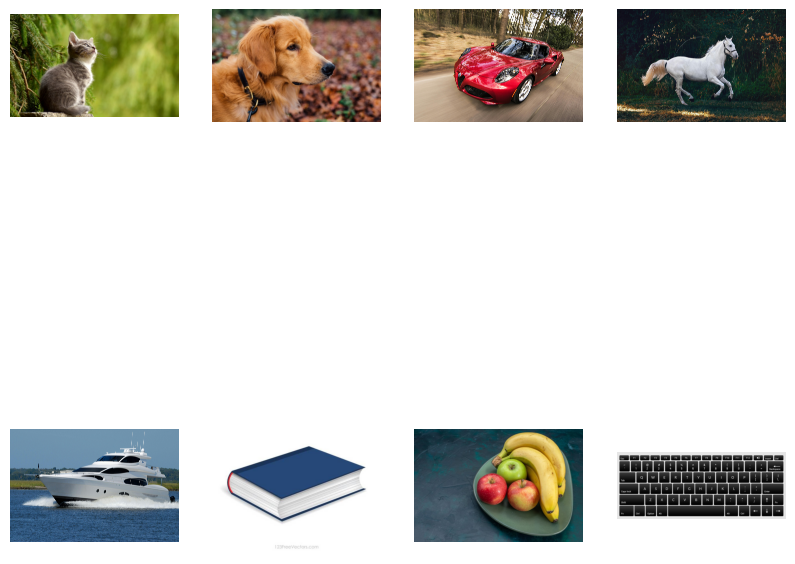

In [ ]:
# Load some images for test
# Image Examples
image_paths = [
    "https://cdn.pixabay.com/photo/2017/02/20/18/03/cat-2083492_1280.jpg",
    "https://images.all-free-download.com/images/graphiclarge/adorable_animal_breed_canine_cute_dog_doggy_603714.jpg",
    "https://images.pexels.com/photos/210019/pexels-photo-210019.jpeg?cs=srgb&dl=pexels-pixabay-210019.jpg&fm=jpg",
    "https://images.pexels.com/photos/1996333/pexels-photo-1996333.jpeg",
    "https://images.pexels.com/photos/163236/luxury-yacht-boat-speed-water-163236.jpeg?cs=srgb&dl=pexels-pixabay-163236.jpg&fm=jpg",
    "https://i.pinimg.com/736x/81/a7/4a/81a74a1948bea28626d9aa2008191c09.jpg",
    "https://img.freepik.com/free-photo/front-view-different-fruit-composition-apples-bananas-dark-blue-desk-fruit-fresh-mellow-exotic-tropical_140725-53049.jpg",
    "https://t4.ftcdn.net/jpg/03/11/60/31/360_F_311603103_BoOOZ7Kzg9AKmAFLtjKshuGBFJWOGlHI.jpg"
]
fig, axes = plt.subplots(2, 8//2, figsize=(10, 10))

for image, ax in zip(image_paths, axes.flatten()):
      image = model.pretrained_frugcrl.load_image(image)
      ax.imshow(image)
      ax.axis("off")
plt.show()

In [ ]:
# Encode audio into vector
outputs = model.encode_audio(audios=["audio.wav"])
outputs.shape

torch.Size([1, 256])

In [ ]:
# Encode audio intto sequence
outputs = model.encode_audio(audios=["audio.wav"], outputs="sequence")
outputs.shape

torch.Size([1, 499, 256])

In [ ]:
# Encode text into vector
outputs = model.pretrained_frugcrl.encode_text(texts=["This is a black dog"])
outputs.shape

torch.Size([1, 256])

In [ ]:
# Encode text into sequence
outputs = model.pretrained_frugcrl.encode_text(texts=["This is a black dog"], outputs="sequence")
outputs.shape

torch.Size([1, 7, 256])

In [ ]:
# Encode image into vector
outputs = model.pretrained_frugcrl.encode_image(image_paths=[image_paths[0]])
outputs.shape

torch.Size([1, 256])

In [ ]:
# Encode image into sequence
outputs = model.pretrained_frugcrl.encode_image(image_paths=[image_paths[0]], outputs="sequence")
outputs.shape

torch.Size([1, 197, 256])

# **Matching**

In [ ]:
class_names = ["cat", "dog", "car", "horse", "boat", "book", "banana", "apple", "keyboard"]
labels = [f"a photo of a {label}" for label in class_names]
audio_names = [f"{class_name}.wav" for class_name in class_names]
# Create audios from texts
for audio_name, label in zip(audio_names, labels):
    _ = text_to_audio(wav_processor, text=label, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path=audio_name)

In [ ]:
# Display audios
for audio in audio_names:
    display(Audio(audio))

In [ ]:
# Matching image and audio
# To read the output raw is images and columns is audios

probs, indices = model.matching_image_audio(audios=audio_names, image_paths=image_paths, top_k=3, strategy="softmax", temperature=1.0)
print("Probabilities: ", probs)
print("Indices: ", indices)

Probabilities:  tensor([[9.6903e-01, 2.2721e-02, 5.1853e-03],
        [9.6715e-01, 2.5017e-02, 3.9179e-03],
        [9.9949e-01, 1.9869e-04, 1.7990e-04],
        [9.9997e-01, 9.8006e-06, 7.6602e-06],
        [9.1660e-01, 8.0117e-02, 1.0060e-03],
        [4.8731e-01, 1.8293e-01, 1.3255e-01],
        [6.9933e-01, 3.0040e-01, 1.2771e-04],
        [9.8621e-01, 1.0916e-02, 1.7625e-03]])
Indices:  tensor([[0, 2, 3],
        [1, 6, 3],
        [2, 4, 8],
        [3, 8, 4],
        [4, 8, 6],
        [0, 1, 8],
        [7, 6, 3],
        [8, 7, 6]])


In [ ]:
# Matching text and audio
# To read the output raw is texts and columns is audios

probs, indices = model.matching_text_audio(audios=audio_names, texts=labels, top_k=3, strategy="softmax", temperature=1.0)
print("Probabilities: ", probs)
print("Indices: ", indices)

Probabilities:  tensor([[9.9999e-01, 5.7799e-06, 4.7944e-06],
        [7.9445e-01, 1.9573e-01, 2.7305e-03],
        [4.1781e-01, 3.3322e-01, 8.3660e-02],
        [9.9995e-01, 1.5119e-05, 1.1220e-05],
        [9.8047e-01, 5.5565e-03, 5.3120e-03],
        [9.9987e-01, 1.0358e-04, 1.0847e-05],
        [9.9999e-01, 4.3015e-06, 7.9490e-07],
        [9.9999e-01, 3.6560e-06, 3.1682e-06],
        [9.0768e-01, 5.5070e-02, 3.6352e-02]])
Indices:  tensor([[0, 5, 7],
        [1, 0, 6],
        [2, 7, 0],
        [3, 7, 0],
        [4, 5, 1],
        [5, 7, 8],
        [6, 5, 0],
        [7, 0, 5],
        [8, 5, 7]])


# **Image Retrieval**

In [ ]:
# Download coco dataset

! mkdir datasets
! mkdir datasets/annotations
! mkdir datasets/train2014
! mkdir datasets/val2014

download_dataset(CFG.data_directory)

mkdir: cannot create directory ‘datasets’: File exists
mkdir: cannot create directory ‘datasets/annotations’: File exists
mkdir: cannot create directory ‘datasets/train2014’: File exists
mkdir: cannot create directory ‘datasets/val2014’: File exists


In [ ]:
# make dataset pairs
training_pairs = make_pairs(CFG.train_annotation_file, CFG.image_dir, 5)

loading annotations into memory...
Done (t=1.80s)
creating index...
index created!


In [ ]:
# sort pairs
training_pairs = sorted(training_pairs, key=lambda x: x[0])
coco_images, coco_captions = zip(*training_pairs)

In [ ]:
# Take unique images
unique_images = set()
unique_pairs = [(item[0], item[1]) for item in training_pairs if item[0] not in unique_images
                and not unique_images.add(item[0])]

coco_images, _ = zip(*unique_pairs)
len(coco_images)

82783

In [ ]:
# Examples
queries = {
    0: "an ocean",
    1:"a cat",
    2:"a dog",
    3:"a white dog",
    4:"one dog sitting on the grass",
    5:"two dog sitting on the grass",
    6: "a family standing next to the ocean on a sandy beach with a surf board",
    7: "a group of people dancing in a party",
    8: "a train",
    9: "an apple",
    10: "a red apple",
    11: "a green apple",
    12: "the company apple",
    13: "a giraffe in the forest",
    14: "a giraffe in a house",

    15: 'a stunning golden sunset over the calm ocean waves',
    16: 'a joyful family enjoying a lovely picnic in the park',
    17: "an adorable puppy happily chasing a ball in the backyard",
    18: "an enchanting view of a historic city with charming architecture",
    19: "a vibrant hot air balloon festival filling the sky with a burst of colors",

    20: "at the beach, a group of friends is having fun, playing beach volleyball, and constructing sandcastles",
    21: "enjoying a day at the seashore, a bunch of friends engages in beach volleyball and constructs sandcastles",
    22: "on the sandy beach, friends have a great time playing beach volleyball and building sandcastles",

    23: "a cat sitting on a bookshelf next to a vase of flowers",
    24: "children playing on the beach, with the ocean waves crashing behind them",
    25: "a family having a picnic under a shady tree in the park",
    26: "a dog running outside the house, chasing after a ball",

    27: "a cozy living room",
    28: "a cozy living room with a fireplace",
    29: "a cat sleeping on the sofa",
    30: "a cozy living room with a fireplace and a cat sleeping on the sofa",

    31: "a dog in the house",
    32: "a dog out the house",
    33:"a dog next to the door",
    34: "a dog and a cat"

}

In [ ]:
# Load coco image features
coco_image_features = torch.load("/content/drive/MyDrive/multimodal/image_embeddings_best.pt", map_location=CFG.device)
coco_image_features.shape

torch.Size([82783, 256])

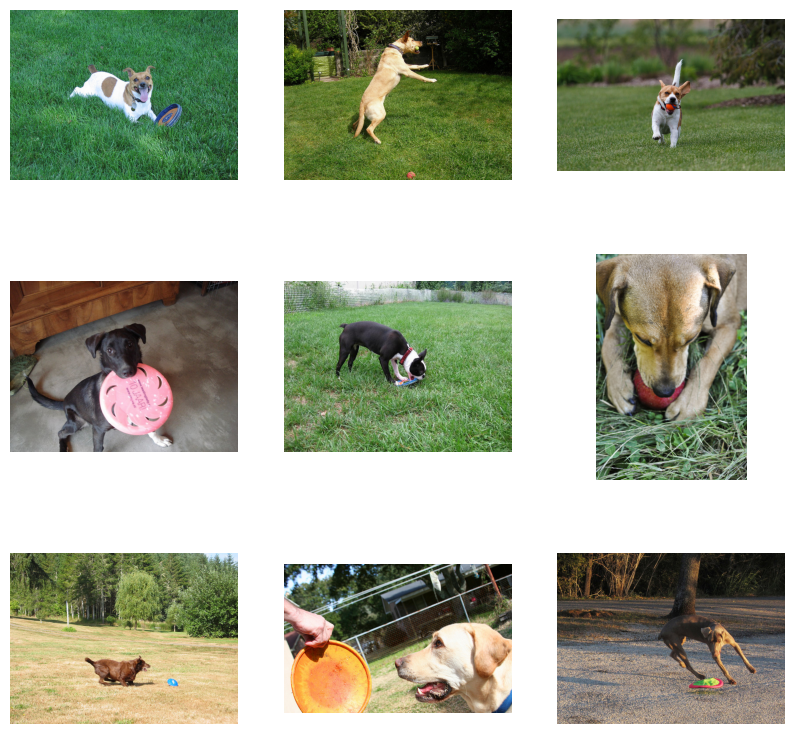

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

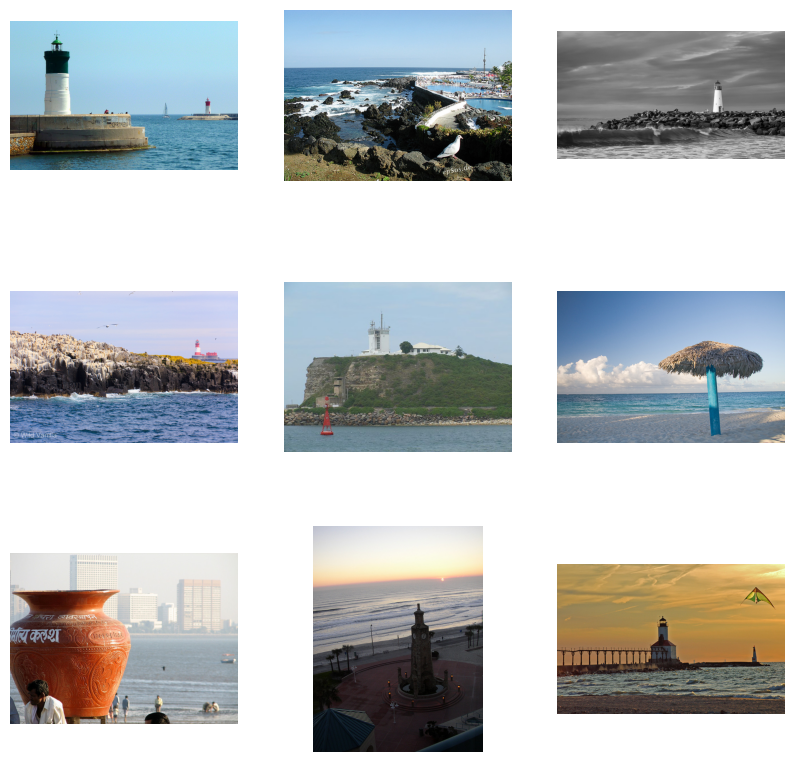

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

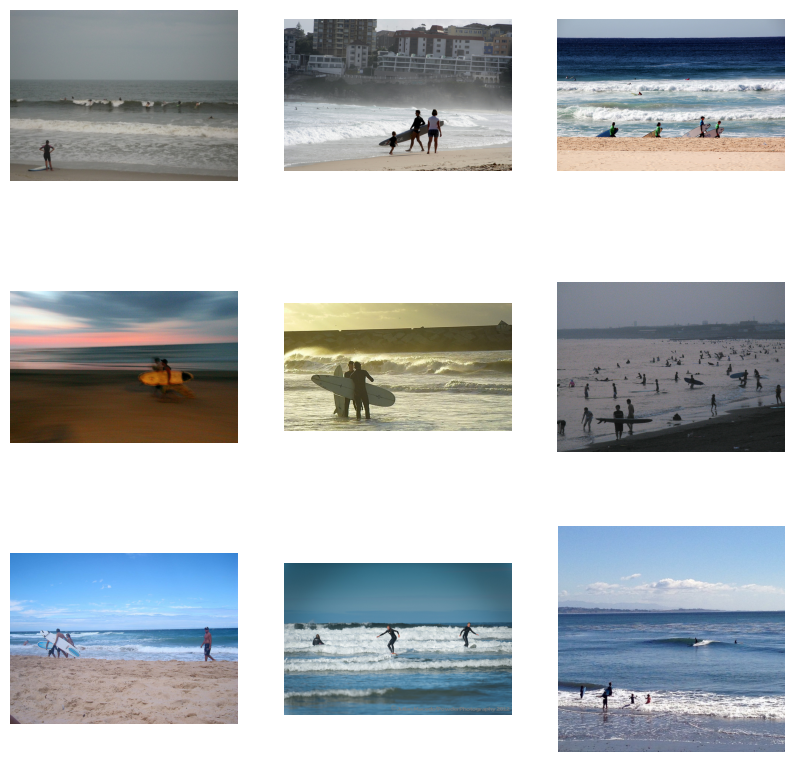

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

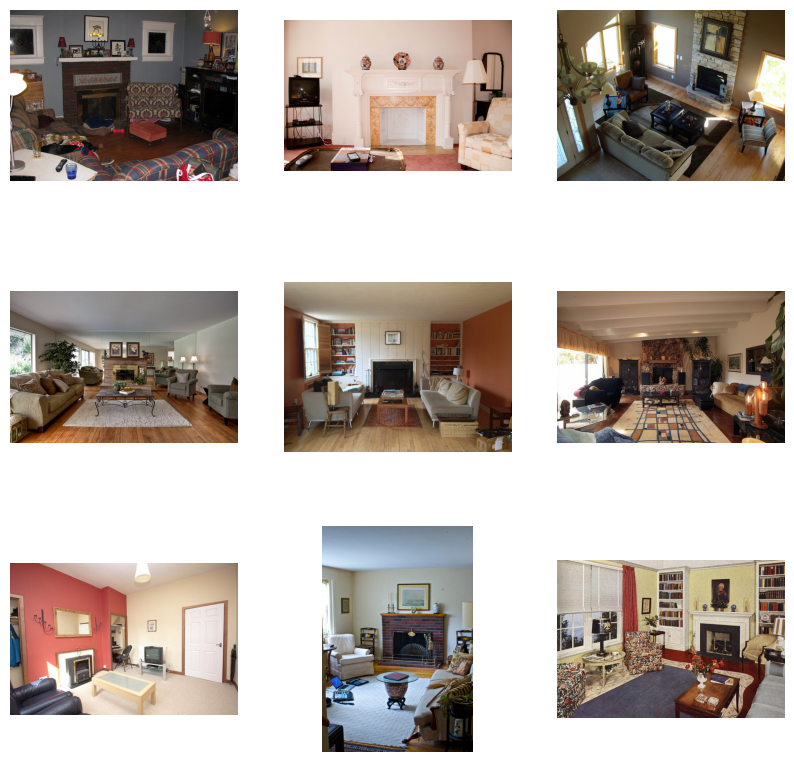

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

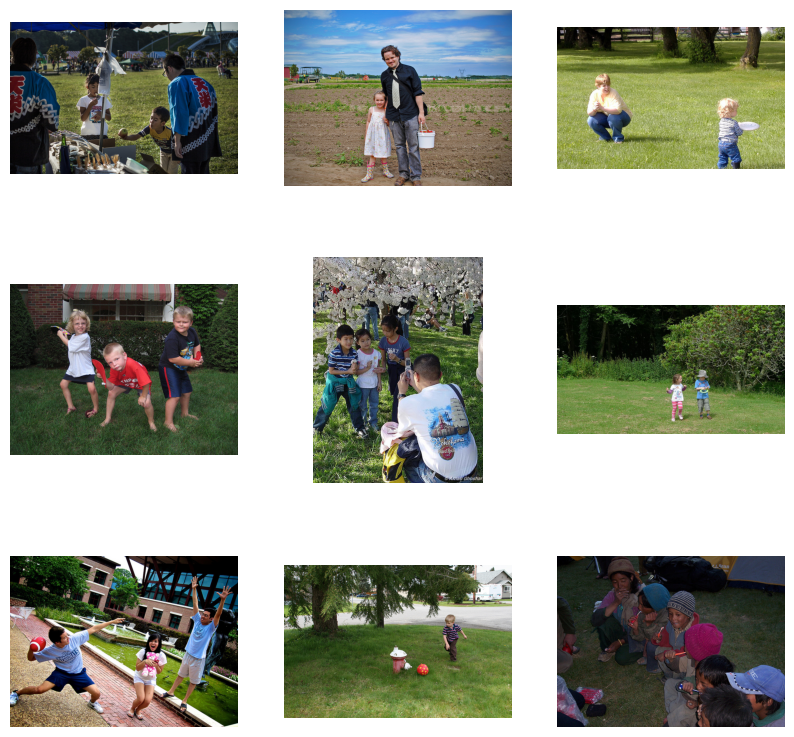

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

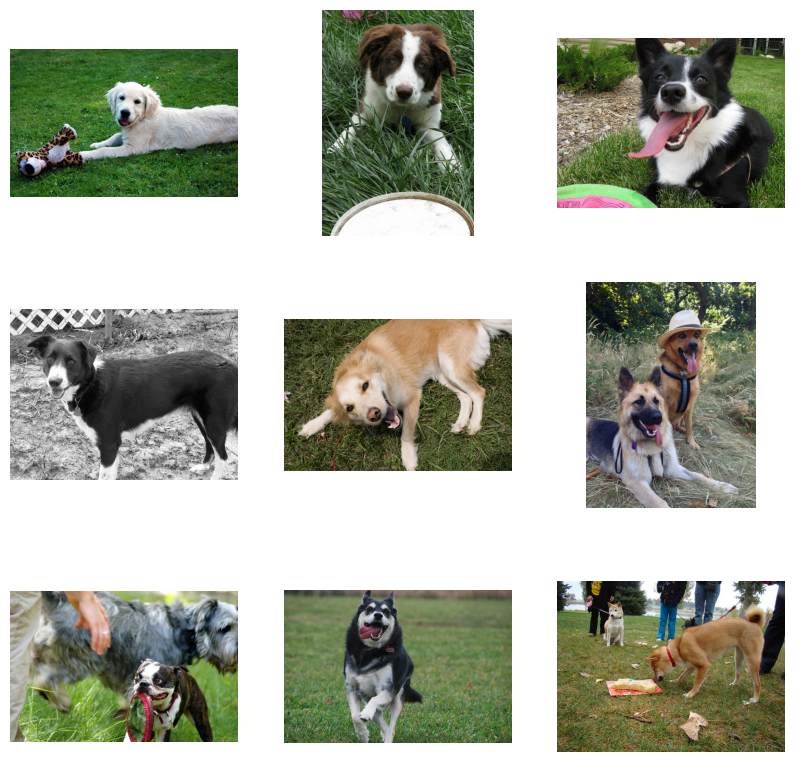

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

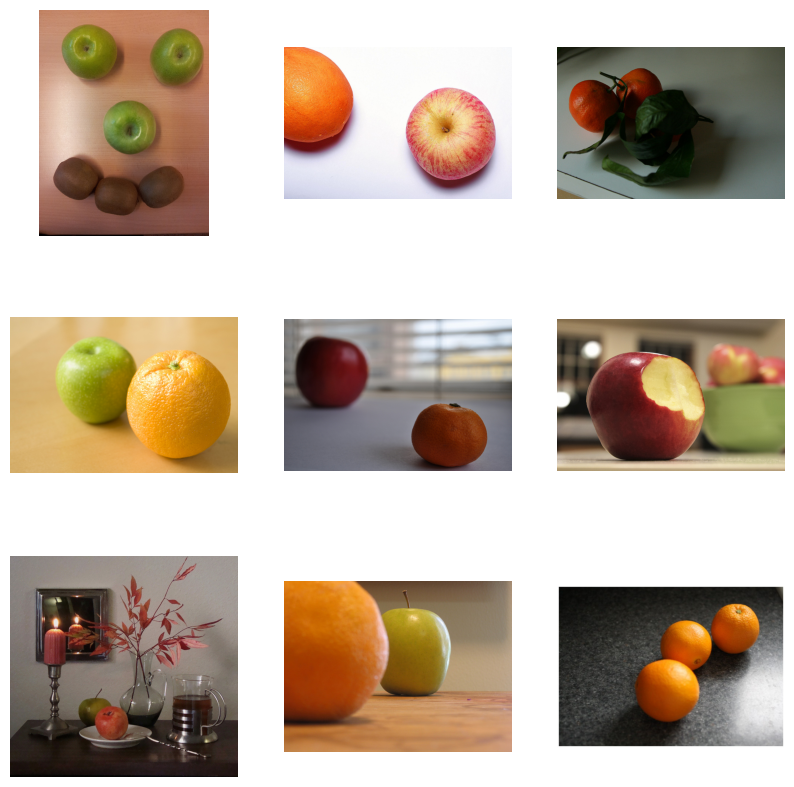

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)


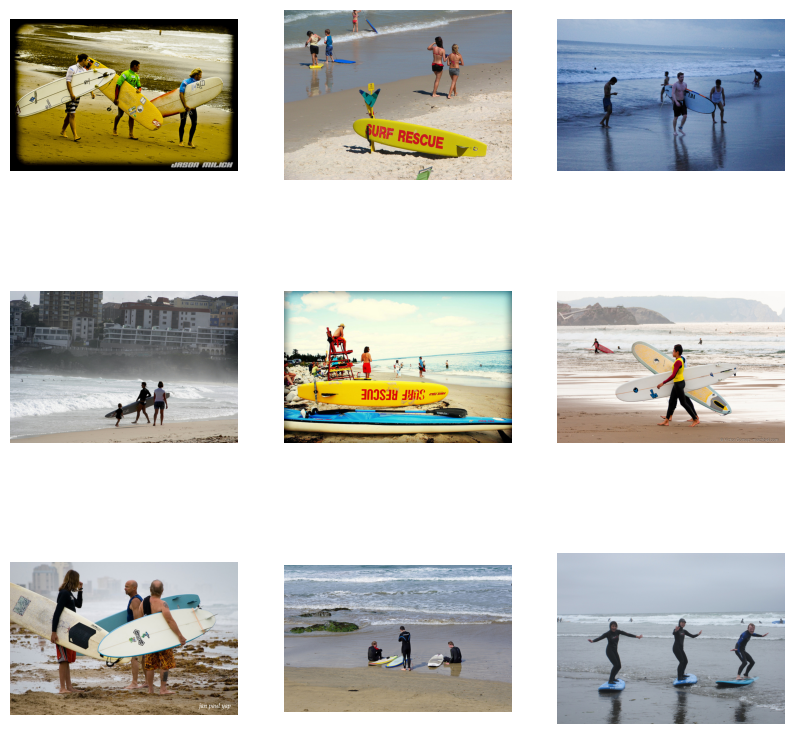

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

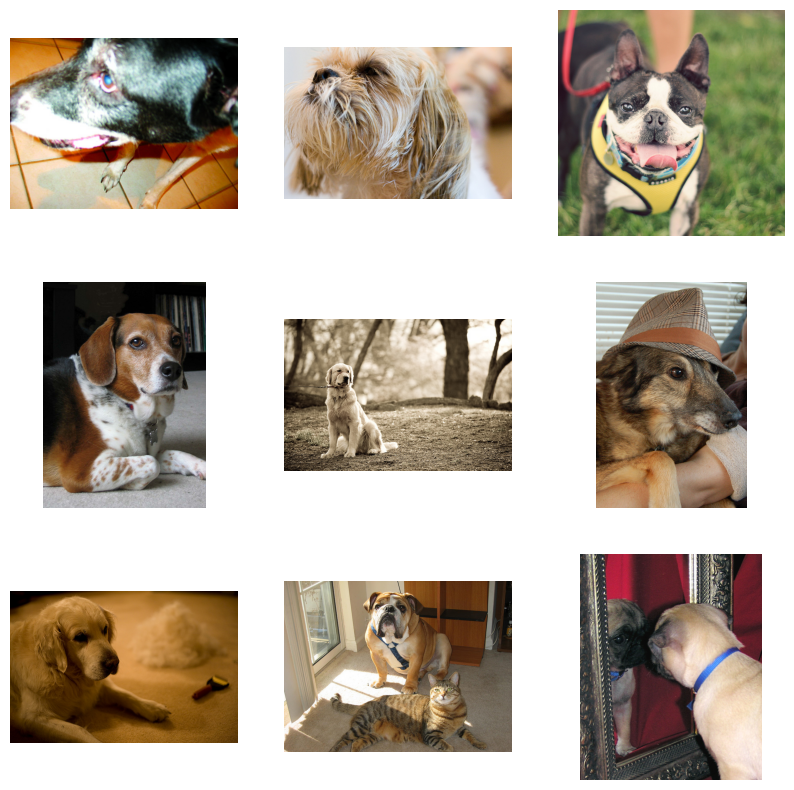

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

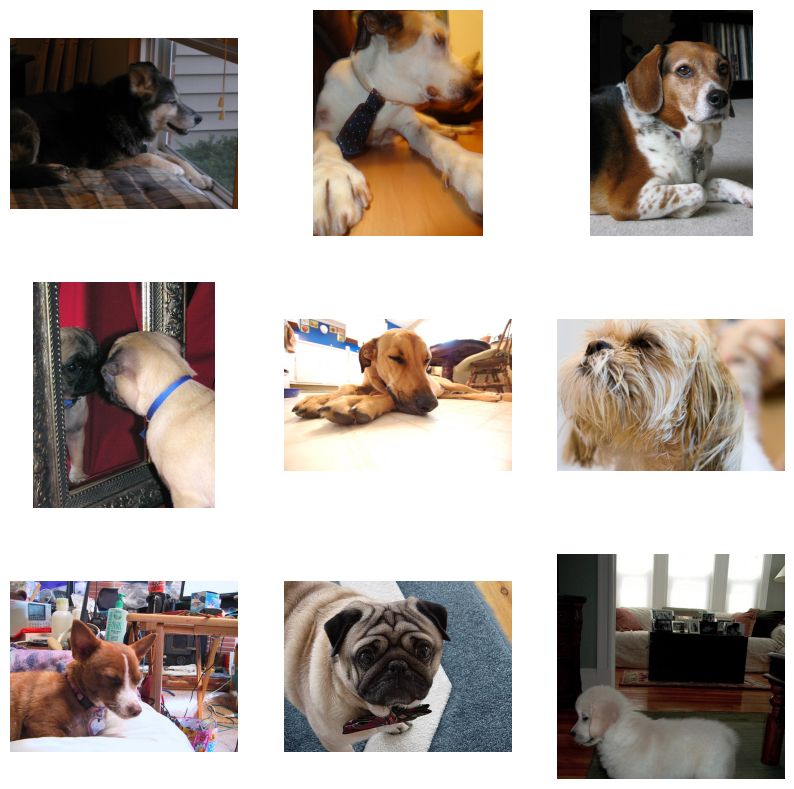

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

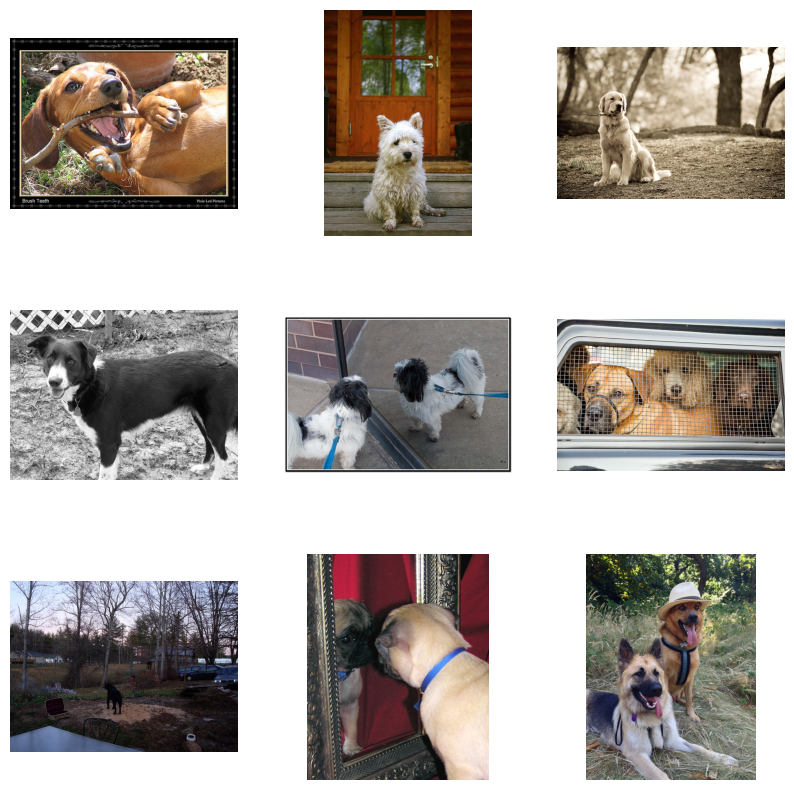

In [ ]:
text = queries[np.random.randint(35)]
text_to_audio_spectrogram = text_to_audio(wav_processor, text=text, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path="query.wav")

probs, indices = model.image_retrieval("query.wav", image_paths=coco_images,
                                       image_embeddings=coco_image_features, n=9, plot=True, temperature=1.0)

# **Zero-shot Image Classification**

In [ ]:
from torch.utils.data import Dataset
import torchvision
from torch.utils.data import DataLoader
import torch
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

In [ ]:
# Create a Dataset Generator

class CustomCIFAR10Dataset(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        img, label = self.dataset[idx]

        # Convert PIL Image to NumPy array
        img = np.array(img)

        if self.transform:
            transformed = self.transform(image=img)
            img = transformed['image']

        return img, label

In [ ]:
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True)
class_names = testset.classes
# Apply Albumentations transform
testset = CustomCIFAR10Dataset(testset, transform=model.pretrained_frugcrl.image_preprocessor)

# Example usage
sample_image, sample_label = testset[0]
print("Transformed Image Shape:", sample_image.shape)
print("Label:", sample_label)

Files already downloaded and verified
Transformed Image Shape: torch.Size([3, 224, 224])
Label: 3


In [ ]:
# Number of images (numpy array)
print("Shape: ", testset.dataset.data.shape)

Shape:  (10000, 32, 32, 3)


In [ ]:
# Create DataLoader for the test set
testloader = DataLoader(testset, batch_size=64, shuffle=False, num_workers=2)

In [ ]:
class_names

['airplane',
 'automobile',
 'bird',
 'cat',
 'deer',
 'dog',
 'frog',
 'horse',
 'ship',
 'truck']

In [ ]:
class_name_bis = class_names
class_name_bis[1] = "car"
class_name_bis[4] = "cow"

In [ ]:
# convert class names to audio
labels = [f"a {name}, this is a photo of {name}" for name in class_name_bis]

# Create audios from texts
for audio_name, label in zip(class_name_bis, labels):
    _ = text_to_audio(wav_processor, text=label, text_processor=text_processor,
                                          audio_generator=audio_generator, vocoder=vocoder, speaker_embeddings=speaker_embeddings,
                                          sample_rate=16000, duration_seconds=10, save_audio=True, audio_save_path=f'{audio_name}.wav')
    display(Audio(f'{audio_name}.wav'))

In [ ]:
def zero_shot_classification(model, dataloader, audio_features, temperature=2.5):

    accuracy = {f"top_{i+1}_accuracy": 0 for i in range(5)}

    for id, batch in enumerate(tqdm(dataloader, desc="Testing")):
        image_tensors, labels = batch
        # Encode images
        image_features = model.pretrained_frugcrl.encode_image(image_tensors=image_tensors)
        image_features = F.normalize(image_features, p=2, dim=-1)
        similarities = (image_features @ audio_features.T) * torch.exp(torch.tensor(temperature).to(model.device))
        text_probs = (10.0 * similarities).softmax(dim=-1)
        _, top_k = text_probs.cpu().topk(5, dim=-1)
        for i in range(5):
            accuracy[f"top_{i+1}_accuracy"] += torch.sum(torch.any(top_k[:, :i+1] == labels.view(-1, 1), dim=-1)).item()

    return accuracy


In [ ]:
# Encode audios
audio_features = model.encode_audio(audios=[f"{name}.wav" for name in class_name_bis])
audio_features = F.normalize(audio_features, p=2, dim=-1)

In [ ]:
accuracy = zero_shot_classification(model, testloader, audio_features)
for name, score in accuracy.items():
    print()
    print(f"{name}: {score/testset.dataset.data.shape[0]}")

Testing:   0%|          | 0/157 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
Testing: 100%|██████████| 157/157 [01:49<00:00,  1.85it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
Testing: 100%|██████████| 157/157 [01:49<00:00,  1.43it/s]


top_1_accuracy: 0.735

top_2_accuracy: 0.8601

top_3_accuracy: 0.914

top_4_accuracy: 0.9458

top_5_accuracy: 0.9639


# **Zero-shot Audio-Text matching**

In [ ]:
import pandas as pd
# Zero-shot audio-text
import torchaudio
import pandas as pd
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import os
from tqdm import tqdm

In [ ]:
# LJ Speech dataset URL
lj_speech_url = "https://data.keithito.com/data/speech/LJSpeech-1.1.tar.bz2"

# Download the dataset (sampling rate = 22050)
dataset = torchaudio.datasets.LJSPEECH(root="./", url=lj_speech_url, download=True)

In [ ]:
# Example usage: Load an audio waveform and transcript
sample = dataset[2]  # Get the first sample
waveform, sample_rate, transcript, _ = sample

# Print sample information
print("Sample rate:", sample_rate)
print("Transcript:", transcript)
print("Waveform shape:", waveform.shape)

Sample rate: 22050
Transcript: For although the Chinese took impressions from wood blocks engraved in relief for centuries before the woodcutters of the Netherlands, by a similar process
Waveform shape: torch.Size([1, 213149])


In [ ]:
# Use the pre-processed dataset
! unzip ljspeech.zip -d ./ljspeech

In [ ]:
# read the csv file
df = pd.read_csv("LJSpeech.csv", sep='|', header=None)
df.head()

,0,1,2
0,LJ001-0001,"Printing, in the only sense with which we are ...","Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.,in being comparatively modern.
2,LJ001-0003,For although the Chinese took impressions from...,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed...","produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...


In [ ]:
# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, dataframe):
        self.data = dataframe.values  # Convert DataFrame to numpy array

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return (os.path.join("ljspeech/ljspeech", f"{self.data[idx][0]}.wav"), self.data[idx][1]) # give right directory

# Create an instance of your custom dataset class
custom_dataset = CustomDataset(df)

# Create a data loader with batch size 64
batch_size = 2
data_loader = DataLoader(custom_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
# Example usage: Iterate over batches
for batch in data_loader:
    wav_name, text = batch
    print("First column values:", wav_name)
    print("Second column values:", text)
    break

First column values: ('ljspeech/ljspeech/LJ018-0077.wav', 'ljspeech/ljspeech/LJ012-0253.wav')
Second column values: ('Although manacled, he managed to get a pistol from his chest and load it.', 'A further discovery was made in an osier bed near Cold Harbor Lane, Camberwell,')


In [ ]:
# Count positive and negative matching
def count_diagonal_elements(matrix, threshold):
    # Get the diagonal elements of the matrix
    diagonal = torch.diag(matrix)

    # Count the number of elements greater than or equal to the threshold
    count_greater_equal = torch.sum(diagonal >= threshold)

    # Count the number of elements less than the threshold
    count_less = torch.sum(diagonal < threshold)

    return count_greater_equal.item(), count_less.item()

In [ ]:
# Initialize precision and missing counts -> scaled dot product
precision = 0
missing = 0
num = 0
# Iterate over batches with tqdm
for batch in tqdm(data_loader, desc="Calculating precision"):
    audios, texts = batch
    probs, _ = model.matching_text_audio(texts=texts, audios=audios, strategy="softmax")
    p, m = count_diagonal_elements(probs, 0.5)
    precision += p
    missing += m

# Calculate precision and missing ratios
precision_ratio = precision / df.shape[0]
missing_ratio = missing / df.shape[0]
print()
print("Precision: ", precision_ratio)
print("Missing: ", missing_ratio)

Calculating precision: 100%|██████████| 6550/6550 [13:27<00:00,  8.11it/s]


Precision:  0.7318320610687022
Missing:  0.2681679389312977
